In [1]:
# native
import os

# modules
from utils import *
from dataset import *
from vgg19 import *
from score import *
from trainer import *
from logger import *


import cv2

from PIL import Image, ImageFilter

# pytorch
import torch
from torch.utils.data import DataLoader

import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms

from torchvision.utils import make_grid
import matplotlib.pyplot as plt


class dotdict(dict):
    """
    a dictionary that supports dot notation
    as well as dictionary access notation
    usage: d = dotdict() or d = dotdict({'val1':'first'})
    set attributes: d.val2 = 'second' or d['val2'] = 'second'
    get attributes: d.val2 or d['val2']
    """
    __getattr__ = dict.__getitem__
    __setattr__ = dict.__setitem__
    __delattr__ = dict.__delitem__

    def __init__(self, dct):
        super().__init__()
        for key, value in dct.items():
            if hasattr(value, 'keys'):
                value = dotdict(value)
            self[key] = value


In [2]:
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
])

# trainset = datasets.CIFAR10(root='./data', train=True, download=True, transform=transform_train)

In [3]:
requirements = {
    torch: '1'
}

check_requirements(requirements)

config = dotdict({
    'inputSize': 224,
    'batchSize': 32,
    'rootPath': './space',
    'numberOfWorkers': 8
})

In [74]:
IMAGE_SIZE = (config.inputSize, config.inputSize)

VAE_IMAGE_SIZE = (128, 128)

imagenet_normalization_values = {
    'mean': [0.485, 0.456, 0.406],
    'std': [0.229, 0.224, 0.225]
}

normalize = transforms.Normalize(**imagenet_normalization_values)
denormalize = DeNormalize(**imagenet_normalization_values)


def toImage(tensor_image):
#     return toPILImage(tensor_image)
    return toPILImage(denormalize(tensor_image))

raw_transforms = transforms.Compose([
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor()
])

train_transforms = transforms.Compose([
    transforms.RandomResizedCrop(IMAGE_SIZE[0]),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    normalize
])

nobilateral_train_transforms = transforms.Compose([
#     transforms.RandomResizedCrop(IMAGE_SIZE[0]),
#     lambda x: np.array(x),
#     np_transforms.RandomHorizontalFlip(),
    lambda x: np.array(x),
    transforms.ToPILImage(),
    transforms.ToTensor(),
#     normalize
])

bilateral_train_transforms = transforms.Compose([
#     transforms.RandomResizedCrop(IMAGE_SIZE[0]),
#     lambda x: np.array(x),
#     np_transforms.RandomHorizontalFlip(),
    lambda x: np.array(cv2.bilateralFilter(np.array(x), 10, 100, 50)),
    transforms.ToPILImage(),
    transforms.ToTensor(),
#     normalize
])

test_transforms = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    normalize
])

pair_transforms = transforms.Compose([
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.ToTensor(),
    normalize
])

highpass_transforms = transforms.Compose([
    transforms.CenterCrop(IMAGE_SIZE),
    transforms.Grayscale(num_output_channels=1),
    transforms.ToTensor(),
    lambda x: (x > 0.2) * 255
])


vae_transforms = transforms.Compose([
    transforms.Resize(VAE_IMAGE_SIZE),
    transforms.ToTensor()
])

def load_data(dataset_name, split):
    dataset_path = os.path.join(config.rootPath, 'datasets', dataset_name)

    istrain = split == 'train'
    transforms = nobilateral_train_transforms if dataset_name == 'stylized-imagenet200-0.0' else nobilateral_train_transforms # if istrain else test_transforms

    dataset = ImageNet200Dataset(dataset_path, split=split, transforms=transforms)#raw_transforms)
    loader = DataLoader(dataset, batch_size=config.batchSize, shuffle=istrain, num_workers=config.numberOfWorkers)

    print('{} dataset {} has {} datapoints in {} batches'.format(split, dataset_name, len(dataset), len(loader)))

    return dataset, loader

def load_pair_data(dataset_names, split, target_type):
    input_dataset_path = os.path.join(config.rootPath, 'datasets', dataset_names[0])
    target_dataset_path = os.path.join(config.rootPath, 'datasets', dataset_names[1])

    istrain = split == 'train'
    target_transforms = highpass_transforms if target_type == 'highpass' else vae_transforms

    dataset = ImageNet200PairDataset(input_dataset_path, target_dataset_path, split=split,
        transforms=vae_transforms, target_type=target_type, target_transforms=target_transforms)
    loader = DataLoader(dataset, batch_size=config.batchSize, shuffle=istrain, num_workers=config.numberOfWorkers)

    print('{} dataset pair ({}, {}) has {} datapoints in {} batches'.format(split, dataset_names[0], dataset_names[1],
        len(dataset), len(loader)))

    return dataset, loader

_, nonstylized_highpass_loader = load_pair_data(['stylized-imagenet200-0.0', 'stylized-imagenet200-1.0'],
                            'train', 'highpass')

# original_train_dataset, original_train_loader = load_data('miniimagenet', 'train')
# original_val_dataset, original_val_loader = load_data('miniimagenet', 'val')

# stylized_train_dataset, stylized_train_loader = load_data('stylized-miniimagenet-1.0', 'train')
# stylized_val_dataset, stylized_val_loader = load_data('stylized-miniimagenet-1.0', 'val')

# for dataset, loader in [
#     (original_train_dataset, original_train_loader),
#     (original_val_dataset, original_val_loader),
#     (stylized_train_dataset, stylized_train_loader),
#     (stylized_val_dataset, stylized_val_loader)
# ]:
#     print('{} Datapoints in {} Batches'.format(len(dataset), len(loader)))

# all_dataset_names = [
#     'stylized-imagenet200-1.0', 'stylized-imagenet200-0.9', 'stylized-imagenet200-0.8',
#     'stylized-imagenet200-0.7', 'stylized-imagenet200-0.6', 'stylized-imagenet200-0.5',
#     'stylized-imagenet200-0.4', 'stylized-imagenet200-0.3', 'stylized-imagenet200-0.2',
#     'stylized-imagenet200-0.1', 'stylized-imagenet200-0.0', 'imagenet200'
# ]

# dataset_names = [
#     'stylized-imagenet200-1.0',
#     'stylized-imagenet200-0.0'
# ]

# val_all_dataset_store = {}

# for dataset_name in all_dataset_names:
#     val_all_dataset_store[dataset_name] = load_data(dataset_name, 'val')

# val_dataset_store = {}

# for dataset_name in dataset_names:
#     val_dataset_store[dataset_name] = load_data(dataset_name, 'val')


100%|██████████| 100000/100000 [00:07<00:00, 12692.38it/s]

train dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 100000 datapoints in 3125 batches


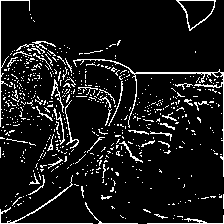

In [76]:
# def show_binarized(index):
#     img = nonstylized_highpass_loader.dataset[index][3]
#     binarized = 
#     return binarized * 255

toPILImage(nonstylized_highpass_loader.dataset[400][3])

In [43]:
dataset, loader = val_all_dataset_store['imagenet200']
for d_index, datapoint in enumerate(dataset):
    if datapoint[-1] == 'baluster':
        print(d_index, datapoint[-1])
        break

50 baluster


brain coral


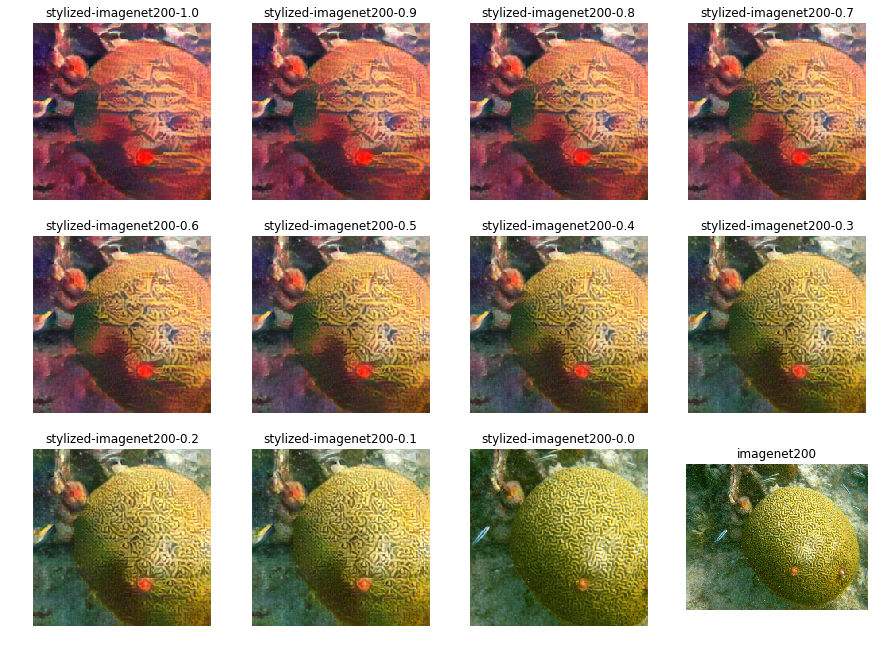

cougar


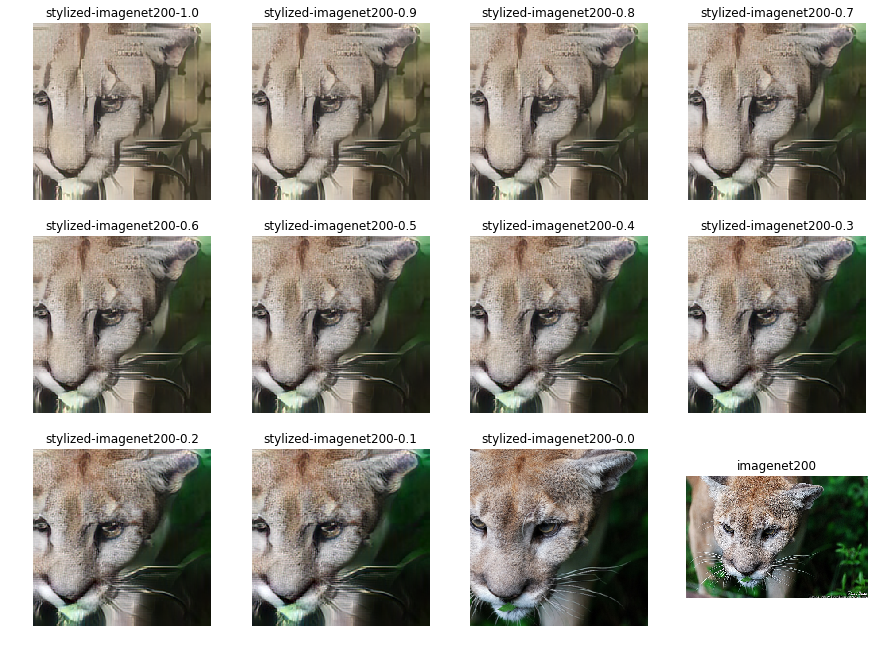

baluster


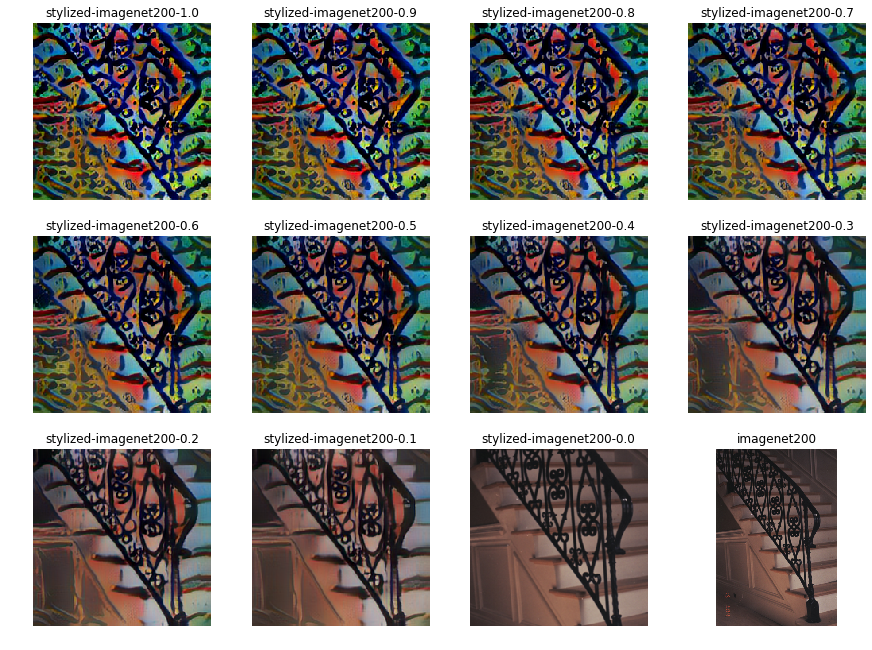

pulled rickshaw


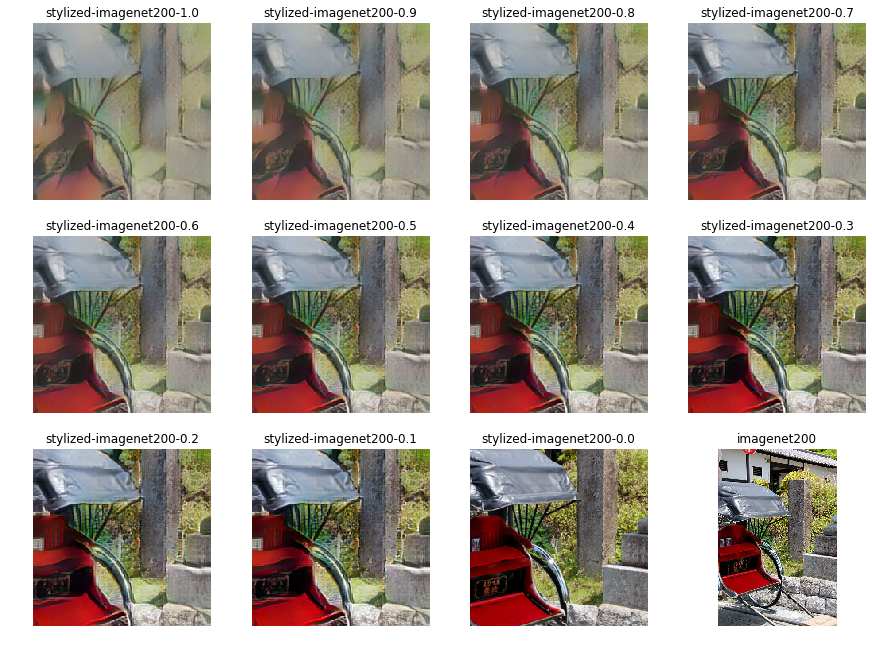

rugby ball


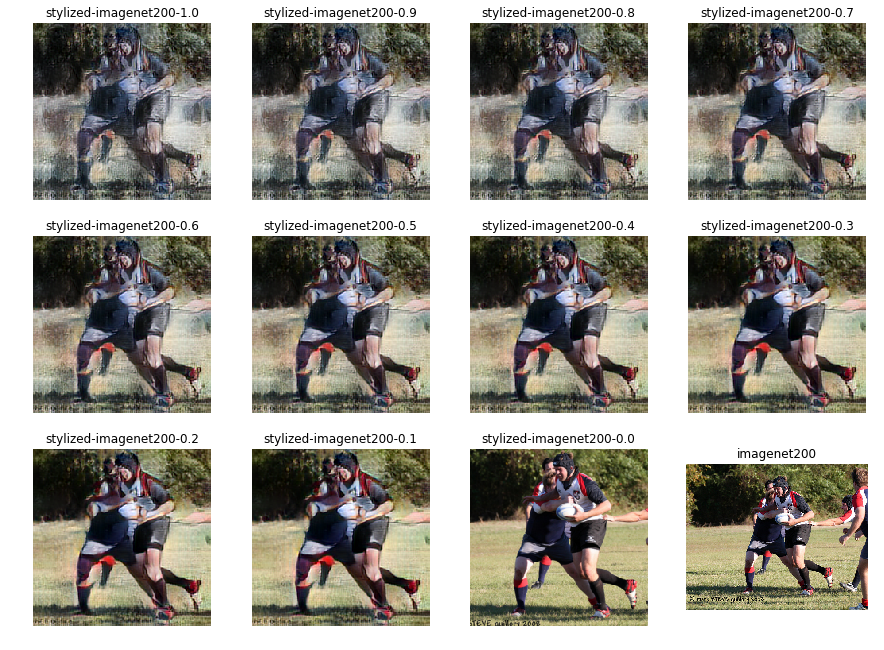

lawn mower


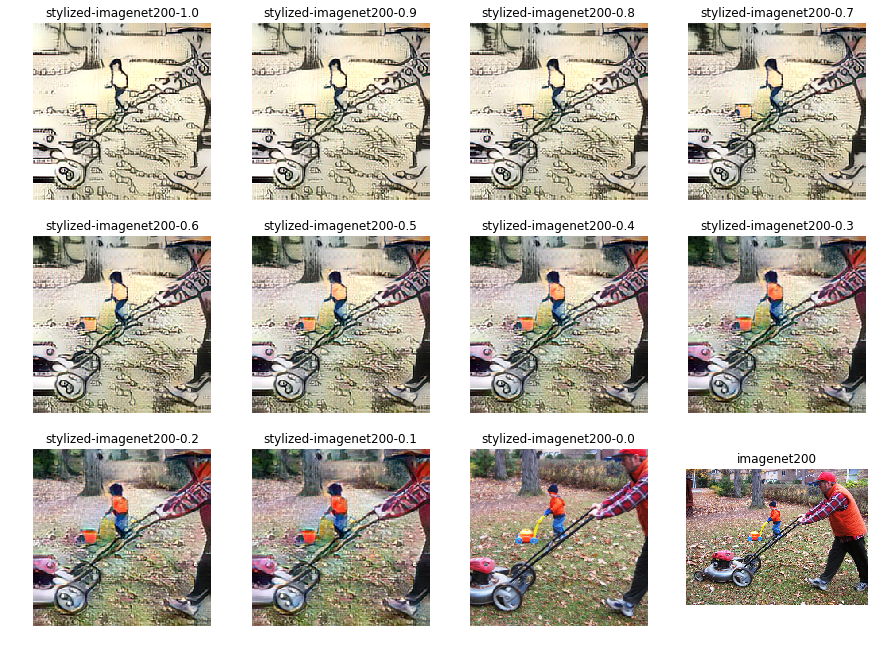

black stork


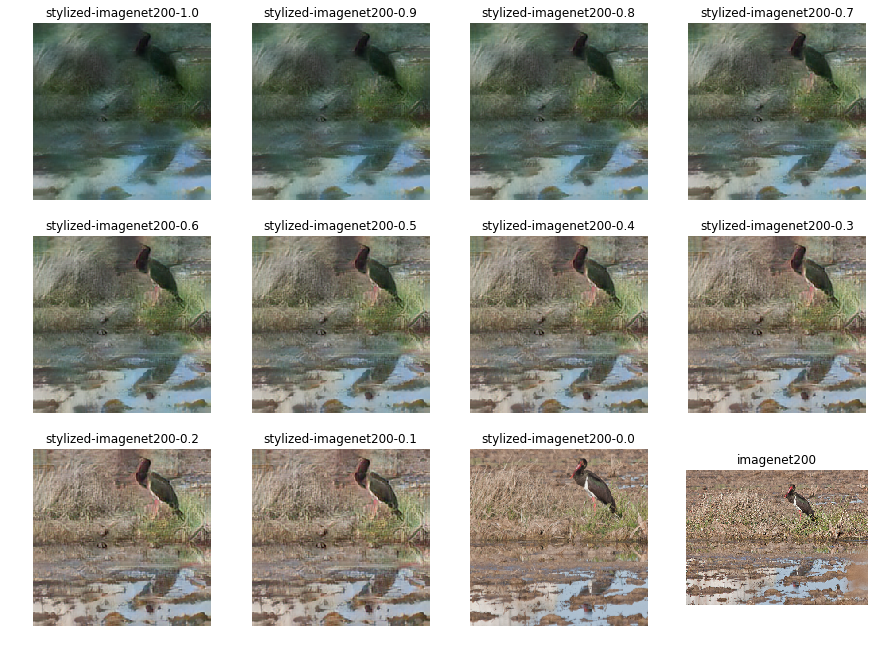

lakeshore


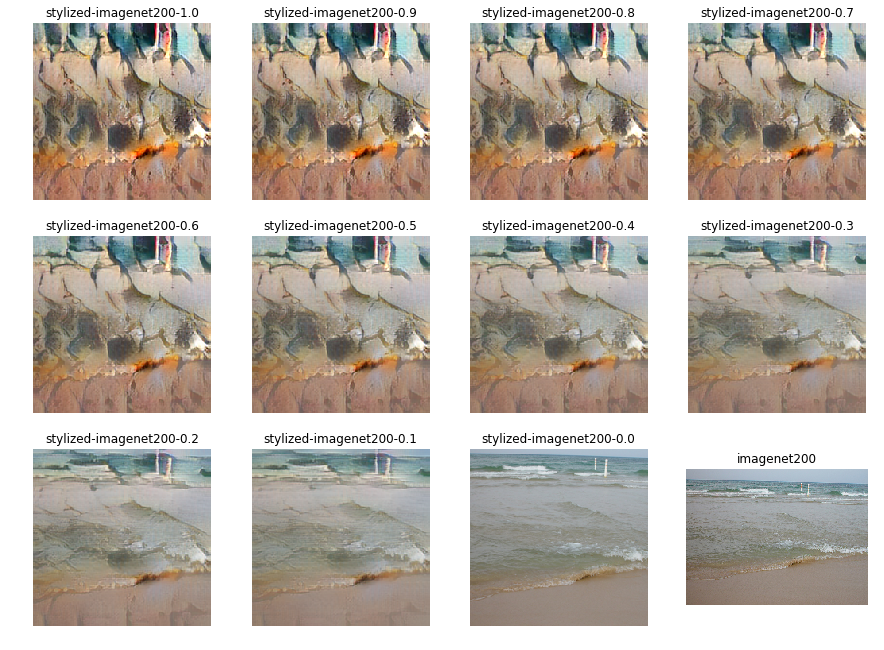

In [6]:
%matplotlib inline

# def show(img):
#     npimg = img.numpy()
#     plt.imshow(np.transpose(npimg, (1,2,0)))

def show_datapoint(index):
    fig = plt.figure(figsize=(15, 15))
    imagelist = []
    i = 1
    for dataset_name, (dataset, loader) in val_all_dataset_store.items():
        plt.subplot(4, 4, i)
        image = toPILImage(dataset[index][dataset.INDEX_IMAGE])
        plt.imshow(image)
        plt.title(dataset_name)
        plt.axis('off')
#         plt.subplot(4, 4, i+2)
#         filtered = image.filter(ImageFilter.FIND_EDGES)
#         plt.imshow(filtered)
#         plt.title(dataset_name)
#         plt.axis('off')
        i = i + 1
    print(dataset[index][dataset.INDEX_LABEL])
    plt.show()
#     show(make_grid(imagelist, nrow=4))

# 1 2 50 500
show_datapoint(1)
show_datapoint(2)
show_datapoint(50)
show_datapoint(500)
show_datapoint(5000)
show_datapoint(2500)
show_datapoint(250)
show_datapoint(25)

In [7]:
%matplotlib inline

def show_image_all(index):
    fig = plt.figure(figsize=(15, 10))
    imagelist = []
    i = 1
    for dataset_name, (dataset, loader) in val_all_dataset_store.items():
        plt.subplot(3, 4, i)
        image = dataset[index][dataset.INDEX_IMAGE]
        image = toPILImage(image)
        plt.imshow(image)
        plt.title(dataset_name)
        plt.axis('off')
        i = i + 1
    print(dataset[index][dataset.INDEX_LABEL])
    plt.show()

# show_image_all(666)


In [8]:
%matplotlib inline

# def show(img):
#     npimg = img.numpy()
#     plt.imshow(np.transpose(npimg, (1,2,0)))

def show_image(index):
    fig = plt.figure(figsize=(15, 15))
    imagelist = []
    i = 1
    for dataset_name, (dataset, loader) in val_dataset_store.items():
        plt.subplot(4, 4, i)
#         permute = [0, 1, 2]
        image = dataset[index][dataset.INDEX_IMAGE]
        image = toPILImage(image)
        plt.imshow(image)
        plt.title(dataset_name)
        plt.axis('off')
        plt.subplot(4, 4, i+2)
        filtered = toPILImage(highpass_transforms(image.filter(ImageFilter.FIND_EDGES)))
        plt.imshow(filtered)
        plt.title(dataset_name)
        plt.axis('off')
        i = i + 1
    print(dataset[index][dataset.INDEX_LABEL])
    plt.show()
#     show(make_grid(imagelist, nrow=4))


alp


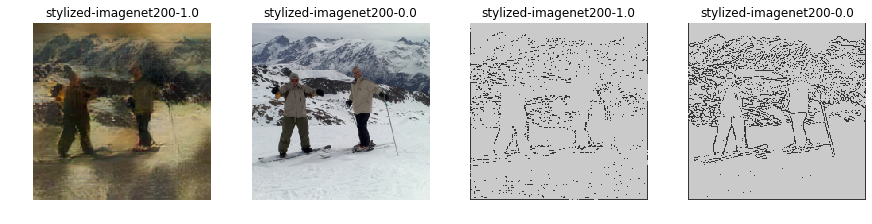

brain coral


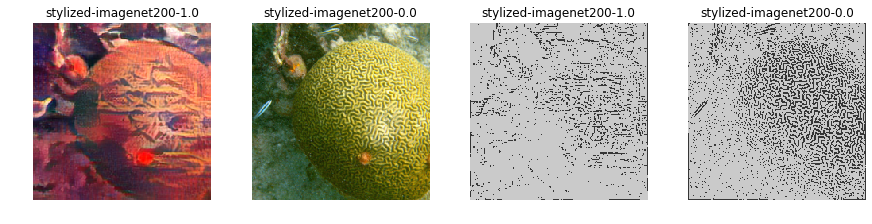

cougar


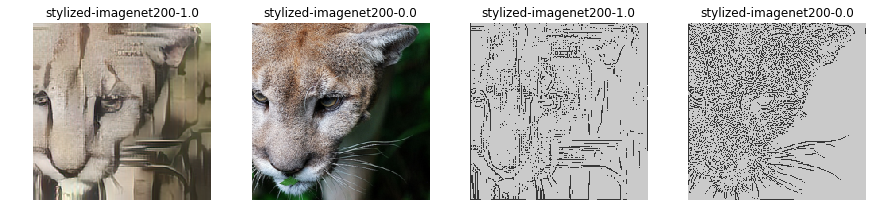

crane


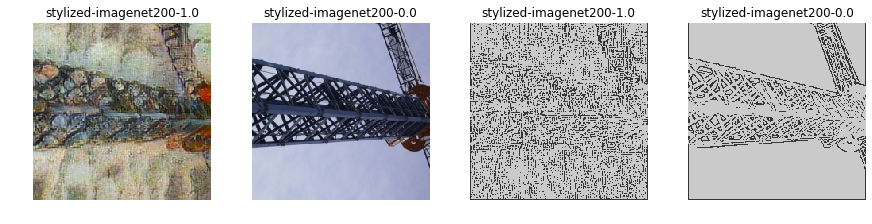

go-kart


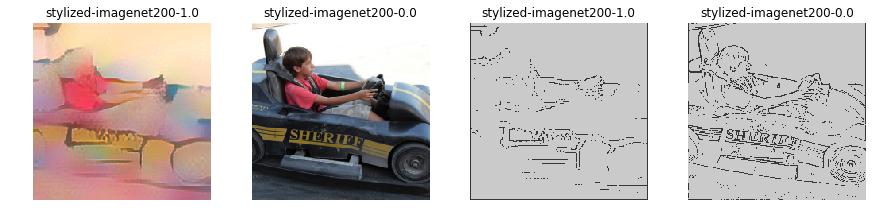

vestment


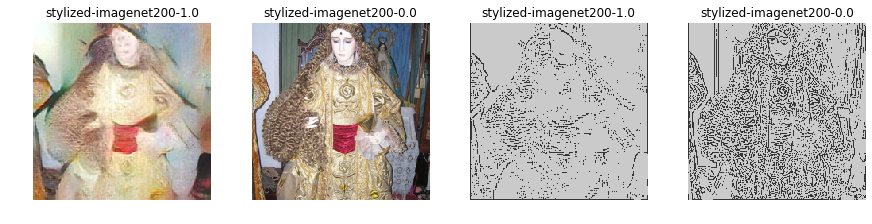

tailed frog


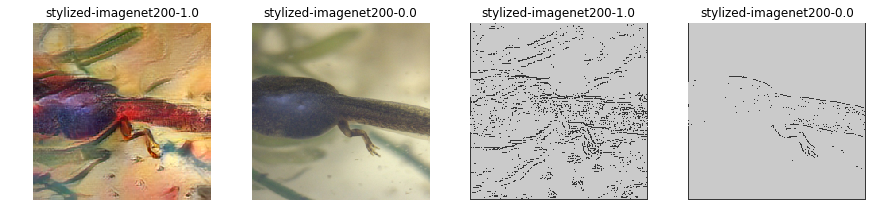

abacus


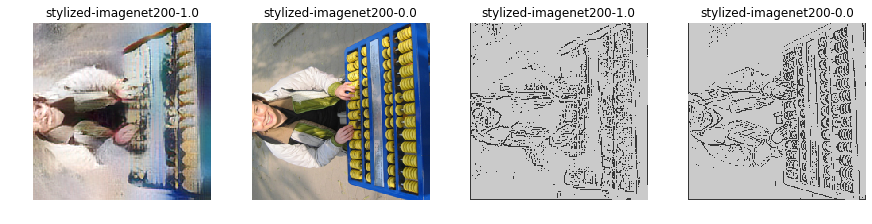

freight car


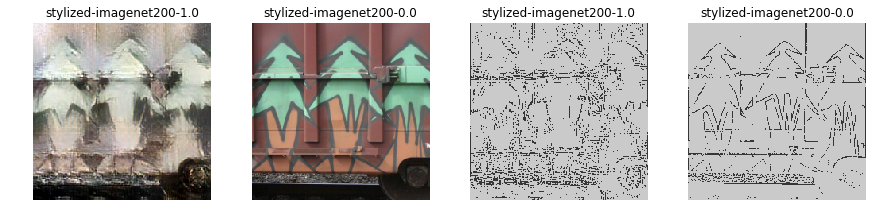

cardigan


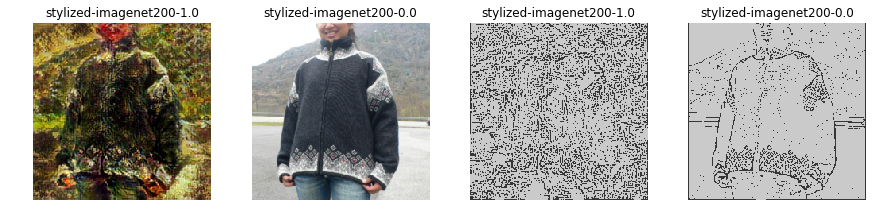

In [9]:
for i in range(0, 10):
    show_image(i)

In [10]:
def load_pair_data(dataset_names, split, target_type):
    input_dataset_path = os.path.join(config.rootPath, 'datasets', dataset_names[0])
    target_dataset_path = os.path.join(config.rootPath, 'datasets', dataset_names[1])

    istrain = split == 'train'
    target_transforms = highpass_transforms if target_type == 'highpass' else pair_transforms

    dataset = ImageNet200PairDataset(input_dataset_path, target_dataset_path, split=split, transforms=pair_transforms, target_type=target_type, target_transforms=target_transforms)
    loader = DataLoader(dataset, batch_size=config.batchSize, shuffle=istrain, num_workers=config.numberOfWorkers)

    print('{} dataset pair ({}, {}) has {} datapoints in {} batches'.format(split, dataset_names[0], dataset_names[1], len(dataset), len(loader)))

    return dataset, loader


100%|██████████| 10000/10000 [00:00<00:00, 14860.61it/s]


val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


100%|██████████| 10000/10000 [00:00<00:00, 14689.98it/s]


val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


100%|██████████| 10000/10000 [00:00<00:00, 13046.06it/s]


val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


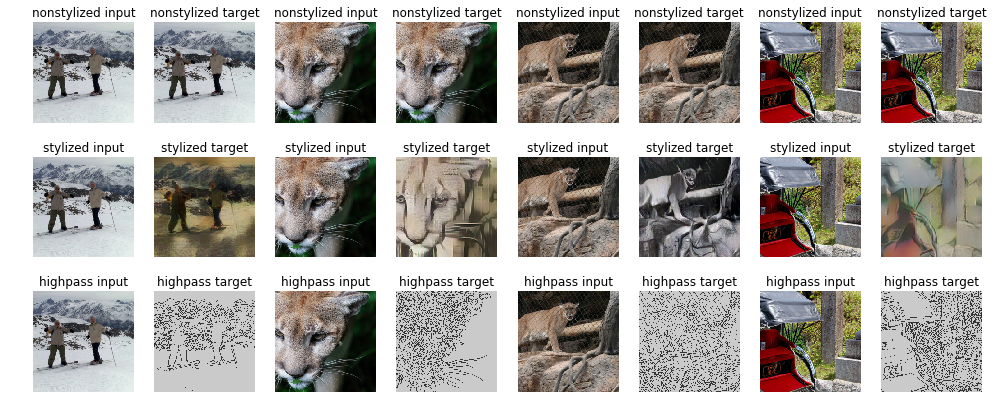

In [11]:
target_types = ['nonstylized', 'stylized', 'highpass']#, 'swap', 'mix']

plt.figure(figsize=(17, 7)) #17
i = 1
for target_type in target_types:
    dataset, loader = load_pair_data(['stylized-imagenet200-0.0', 'stylized-imagenet200-1.0'], 'val', target_type)
    datapoint_indices = [0, 2, 100, 500]
    for datapoint_index in datapoint_indices:
        datapoint = dataset[datapoint_index]
        image1 = toImage(datapoint[dataset.INDEX_IMAGE])
        targetTransform = toPILImage if target_type == 'highpass' else toImage
        image2 = targetTransform(datapoint[dataset.INDEX_TARGET_IMAGE])
        plt.subplot(len(target_types), len(datapoint_indices) * 2, i)
        plt.imshow(image1)
        plt.title('{} input'.format(target_type))
        plt.axis('off')
        i = i + 1
        plt.subplot(len(target_types), len(datapoint_indices) * 2, i)
        plt.imshow(image2)
        plt.title('{} target'.format(target_type))
        plt.axis('off')
        i = i + 1
plt.show()


 15%|█▌        | 1508/10000 [00:00<00:00, 15074.44it/s]

val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


 15%|█▍        | 1495/10000 [00:00<00:00, 14948.13it/s]

val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


100%|██████████| 10000/10000 [00:00<00:00, 14802.84it/s]


val dataset pair (stylized-imagenet200-0.0, stylized-imagenet200-1.0) has 10000 datapoints in 313 batches


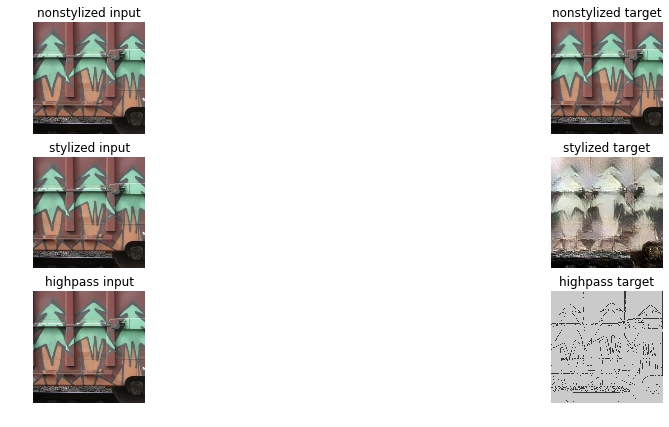

In [12]:
target_types = ['nonstylized', 'stylized', 'highpass']#, 'swap', 'mix']

plt.figure(figsize=(17, 7))
i = 1
for target_type in target_types:
    dataset, loader = load_pair_data(['stylized-imagenet200-0.0', 'stylized-imagenet200-1.0'], 'val', target_type)
    datapoint_indices = [8]
    for datapoint_index in datapoint_indices:
        datapoint = dataset[datapoint_index]
        image1 = toImage(datapoint[dataset.INDEX_IMAGE])
        targetTransform = toPILImage if target_type == 'highpass' else toImage
        image2 = targetTransform(datapoint[dataset.INDEX_TARGET_IMAGE])
        plt.subplot(len(target_types), len(datapoint_indices) * 2, i)
        plt.imshow(image1)
        plt.title('{} input'.format(target_type))
        plt.axis('off')
        i = i + 1
        plt.subplot(len(target_types), len(datapoint_indices) * 2, i)
        plt.imshow(image2)
        plt.title('{} target'.format(target_type))
        plt.axis('off')
        i = i + 1
plt.show()


In [13]:
%matplotlib inline

def normalize_image(image):
    image = np.array(image)
    image = (image - image.min()) / (image.max() - image.min())
    return image

def show_normalized_image(index):
    fig = plt.figure(figsize=(15, 15))
    imagelist = []
    i = 1
    for dataset_name, (dataset, loader) in val_dataset_store.items():
        plt.subplot(4, 4, i)
        image = toPILImage(dataset[index][dataset.INDEX_IMAGE])
        plt.imshow(image)
        plt.title(dataset_name)
        plt.axis('off')
        plt.subplot(4, 4, i+2)
        filtered = toPILImage(highpass_transforms(image))
        filtered = normalize_image(filtered)
        plt.imshow(filtered)
        plt.title(dataset_name)
        plt.axis('off')
        i = i + 1
    print(dataset[index][dataset.INDEX_LABEL])
    plt.show()
#     show(make_grid(imagelist, nrow=4))


alp


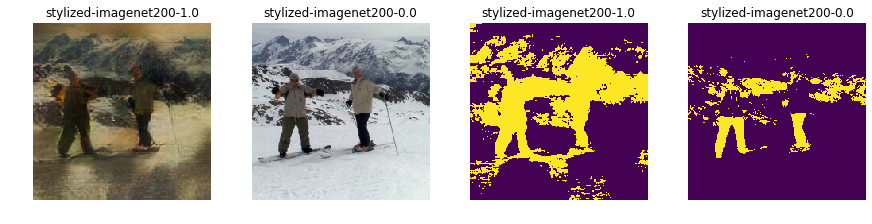

brain coral


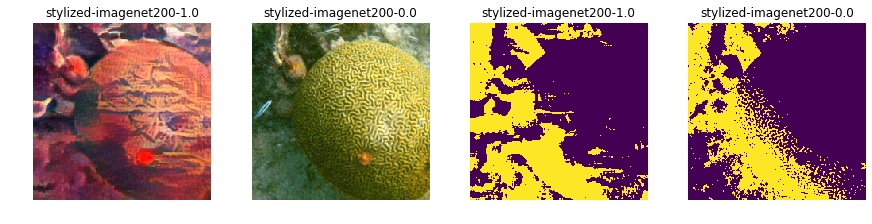

cougar


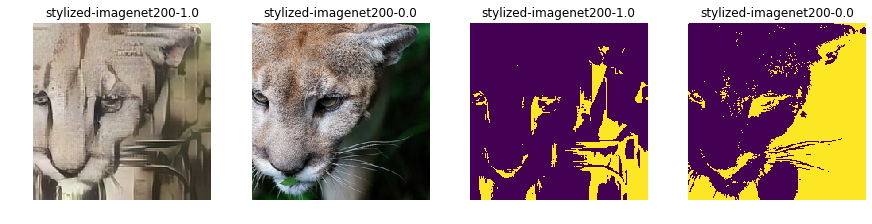

crane


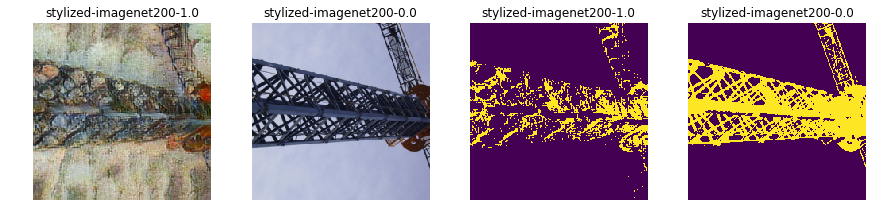

go-kart


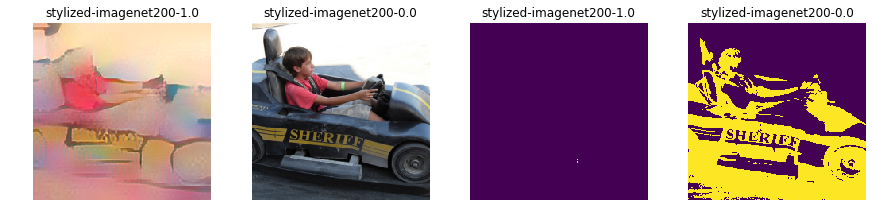

vestment


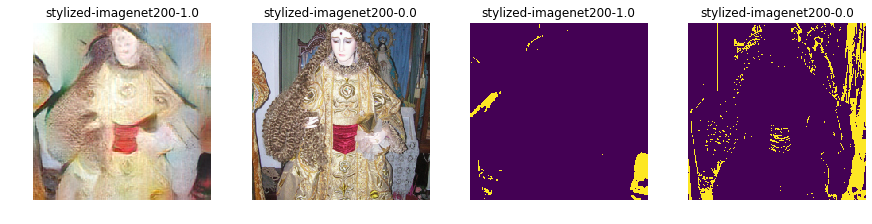

tailed frog


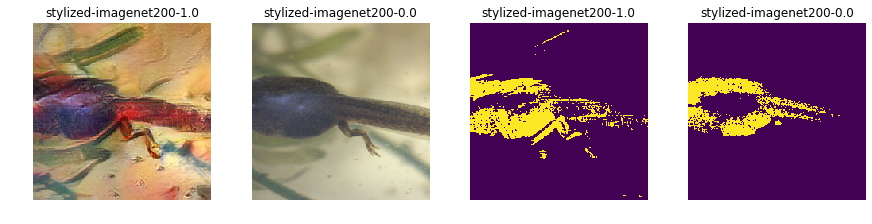

abacus


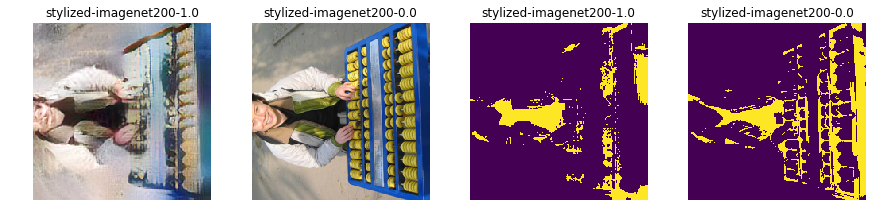

freight car


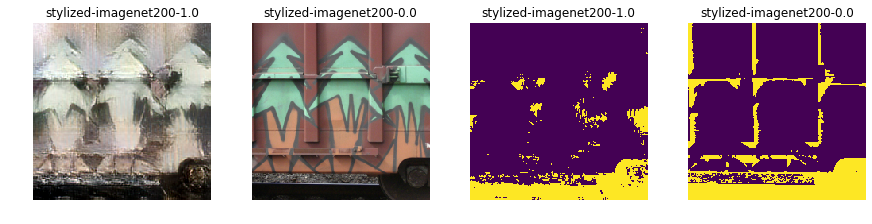

cardigan


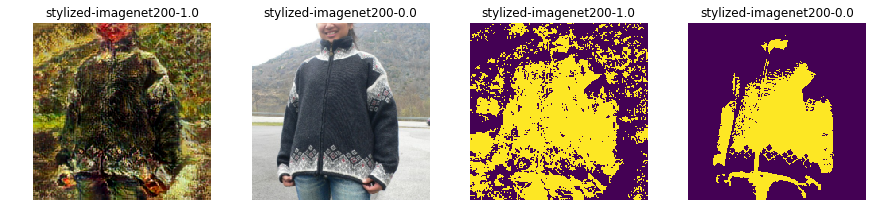

In [14]:
for i in range(0, 10):
    show_normalized_image(i)